### PPO on BipedalWalker-v3 (Gymnasium + Stable-Baselines3)

This notebook trains a PPO agent on `BipedalWalker-v3`. I made it special so that it also lets you replay saved agents, also saved gifs to see the progression. 

- Dependencies are installed below.
- Training uses vectorized envs for efficiency.
- Visualization runs without a display by using `render_mode="rgb_array"`.


In [ ]:
%pip install -q --upgrade pip setuptools wheel
%pip install -q stable-baselines3 gymnasium Box2D imageio[ffmpeg] matplotlib ipywidgets tqdm


Note: you may need to restart the kernel to use updated packages.


^C
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import os
import io
import base64
import math
import time
import pathlib
from typing import List, Tuple, Optional, Dict

import numpy as np
import matplotlib.pyplot as plt
import imageio.v2 as imageio
from IPython.display import HTML, display

import gymnasium as gym
from stable_baselines3 import PPO
from stable_baselines3.common.vec_env import DummyVecEnv, SubprocVecEnv, VecMonitor
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.callbacks import BaseCallback
from stable_baselines3.common.logger import configure

# Ensure output directory
ARTIFACTS_DIR = pathlib.Path("artifacts_bipedal_walker")
ARTIFACTS_DIR.mkdir(exist_ok=True)
VIDEOS_DIR = ARTIFACTS_DIR / "videos"
VIDEOS_DIR.mkdir(exist_ok=True)
MODELS_DIR = ARTIFACTS_DIR / "models"
MODELS_DIR.mkdir(exist_ok=True)
LOGS_DIR = ARTIFACTS_DIR / "logs"
LOGS_DIR.mkdir(exist_ok=True)

ENV_ID = "BipedalWalker-v3"
SEED = 42



Imported existing envrionemment to train a model for bipedal walking RL

In [ ]:
def make_env(seed: int = 0):
    def _thunk():
        env = gym.make(ENV_ID, render_mode="rgb_array")
        env = Monitor(env)
        env.reset(seed=seed)
        return env
    return _thunk

num_envs = max(1, os.cpu_count() // 2)
num_envs = min(num_envs, 4)  # keep reasonable on laptops
print(f"Creating {num_envs} parallel envs")

# Use single-process vectorized env for notebook/Windows reliability
vec_env = DummyVecEnv([make_env(SEED + i) for i in range(num_envs)])
vec_env = VecMonitor(vec_env)


Creating 4 parallel envs


C:\Users\bonit\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\pygame\pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
C:\Users\bonit\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\stable_baselines3\common\vec_env\vec_monitor.py:44: UserWarning: The environment is already wrapped with a `Monitor` wrapperbut you are wrapping it with a `VecMonitor` wrapper, the `Monitor` statistics will beoverwritten by the `VecMonitor` ones.
  warnings.warn(


In [ ]:
class RewardPlotCallback(BaseCallback):
    def __init__(self, verbose: int = 0):
        super().__init__(verbose)
        self.ep_rewards = []
        self.timesteps = []

    def _on_step(self) -> bool:
        infos = self.locals.get("infos", [])
        for info in infos:
            ep_info = info.get("episode")
            if ep_info is not None:
                self.ep_rewards.append(ep_info["r"])
                self.timesteps.append(self.num_timesteps)
        return True

reward_cb = RewardPlotCallback()



In [ ]:
model_log_dir = str(LOGS_DIR / "ppo")
new_logger = configure(model_log_dir, ["stdout", "csv", "tensorboard"])  # tensorboard optional

model = PPO(
    policy="MlpPolicy",
    env=vec_env,
    verbose=1,
    seed=SEED,
    tensorboard_log=model_log_dir,
)
model.set_logger(new_logger)

TOTAL_TIMESTEPS = 500_000  # increase for better performance
model = model.learn(total_timesteps=TOTAL_TIMESTEPS, callback=reward_cb)

# Save after training
model_path = MODELS_DIR / "ppo_bipedalwalker"
model.save(str(model_path))
print(f"Saved model to {model_path}")


Logging to artifacts_bipedal_walker\logs\ppo
Using cpu device
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 538      |
|    ep_rew_mean     | -107     |
| time/              |          |
|    fps             | 2775     |
|    iterations      | 1        |
|    time_elapsed    | 2        |
|    total_timesteps | 8192     |
---------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -109       |
| time/                   |            |
|    fps                  | 1657       |
|    iterations           | 2          |
|    time_elapsed         | 9          |
|    total_timesteps      | 16384      |
| train/                  |            |
|    approx_kl            | 0.00721443 |
|    clip_fraction        | 0.0813     |
|    clip_range           | 0.2        |
|    entropy_loss         | -5.67      |
|    explained_variance 

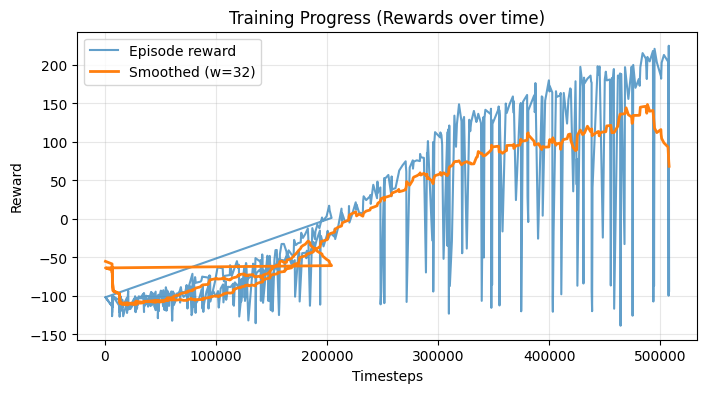

In [ ]:
def plot_training_progress(timesteps: List[int], episode_rewards: List[float]):
    if len(episode_rewards) == 0:
        print("No episode rewards logged yet.")
        return
    plt.figure(figsize=(8,4))
    plt.plot(timesteps, episode_rewards, label="Episode reward", alpha=0.7)
    # Rolling mean for smoothing
    window = max(1, len(episode_rewards)//20)
    if window > 1:
        kernel = np.ones(window)/window
        smoothed = np.convolve(episode_rewards, kernel, mode='same')
        plt.plot(timesteps, smoothed, label=f"Smoothed (w={window})", linewidth=2)
    plt.xlabel("Timesteps")
    plt.ylabel("Reward")
    plt.title("Training Progress (Rewards over time)")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.show()

plot_training_progress(reward_cb.timesteps, reward_cb.ep_rewards)


Saved GIF to: artifacts_bipedal_walker\videos\rollout_1755173406.gif



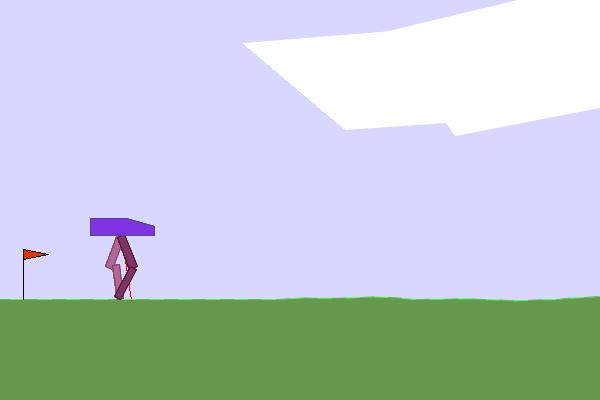

In [ ]:
def record_episode_gif(model: PPO, steps: int = 1600, filename: Optional[str] = None, deterministic: bool = True) -> str:
    if filename is None:
        filename = VIDEOS_DIR / f"rollout_{int(time.time())}.gif"
    else:
        filename = pathlib.Path(filename)
    env = gym.make(ENV_ID, render_mode="rgb_array")
    obs, info = env.reset(seed=SEED)
    frames = []
    for _ in range(steps):
        action, _ = model.predict(obs, deterministic=deterministic)
        obs, reward, terminated, truncated, info = env.step(action)
        frame = env.render()
        frames.append(frame)
        if terminated or truncated:
            obs, info = env.reset()
    env.close()
    imageio.mimsave(filename, frames, fps=30)
    return str(filename)

# Create and display a short rollout GIF
rollout_path = record_episode_gif(model, steps=1000)
print(f"Saved GIF to: {rollout_path}")

def display_gif(path: str, width: int = 640) -> HTML:
    with open(path, 'rb') as f:
        data = base64.b64encode(f.read()).decode('ascii')
    return HTML(f'<img src="data:image/gif;base64,{data}" width="{width}">')

display(display_gif(rollout_path))


In [ ]:
# Bonus: Replay a saved agent with simple controls
import ipywidgets as widgets

# List only saved .zip SB3 models
zip_models = sorted([p.name for p in MODELS_DIR.glob("*.zip")])

model_dropdown = widgets.Dropdown(
    options=zip_models,
    value=(zip_models[0] if len(zip_models) > 0 else None),
    description="Model:"
)
steps_slider = widgets.IntSlider(min=200, max=2000, step=100, value=800, description="Steps")
det_toggle = widgets.Checkbox(value=True, description="Deterministic")
run_button = widgets.Button(description="Replay", button_style="primary")
output = widgets.Output()


def on_replay_clicked(_):
    output.clear_output()
    with output:
        selected = model_dropdown.value
        if selected is None:
            print("No model selected")
            return
        model_path = MODELS_DIR / selected
        loaded = PPO.load(str(model_path))
        gif_path = record_episode_gif(loaded, steps=steps_slider.value, deterministic=det_toggle.value)
        display(display_gif(gif_path))

run_button.on_click(on_replay_clicked)

widgets.VBox([
    widgets.HBox([model_dropdown, steps_slider, det_toggle, run_button]),
    output
])


We can see that the robot plays the system, by crawling and maximizing the reward system. thats why we need to come up with a more complex reward system, rewarding forward velocity, torso pitch, foot-contact flags, and velocity history, and penalizing immobility

### Advanced: Running-focused sensors and reward shaping

We augment observations with running-related features and reshape rewards to incentivize higher forward speed, upright posture, and smooth, energy-efficient gaits (reducing crawling).


In [34]:
import gymnasium as gym
import numpy as np
from gymnasium import spaces

class RunningObsWrapper(gym.ObservationWrapper):
    """Augment observation with proper sensors for bipedal walking.
    
    BipedalWalker-v3 observation space (24-dim):
    [0:4] - hull angle, angular_vel, vel_x, vel_y 
    [4:8] - hip joint angles (left/right) and angular velocities
    [8:12] - knee joint angles (left/right) and angular velocities  
    [12:16] - hip joint motor speeds and torques
    [16:20] - knee joint motor speeds and torques
    [20:24] - leg ground contact sensors (left/right leg, 2 sensors each)
    
    Adds: hull height, leg swing phase detection, center of mass stability,
    joint angle ranges, alternating gait pattern detection, velocity history
    """
    def __init__(self, env: gym.Env, history_len: int = 6):
        super().__init__(env)
        self.history_len = history_len
        orig = env.observation_space
        assert isinstance(orig, spaces.Box)
        self.orig_dim = orig.shape[0]
        
        # Track velocity and position history for motion analysis
        self.velocity_history = []
        self.position_history = []
        self.contact_history = []
        
        # Extra features: hull_height, left_swing_phase, right_swing_phase, 
        # com_stability, joint_extension, gait_alternation, velocity_consistency,
        # avg_velocity, position_progress, velocity_variance
        extra_dim = 10
        
        low = np.concatenate([
            orig.low,
            -np.ones(extra_dim, dtype=np.float32) * 10.0
        ]).astype(np.float32)
        high = np.concatenate([
            orig.high,
            np.ones(extra_dim, dtype=np.float32) * 10.0
        ]).astype(np.float32)
        
        self.observation_space = spaces.Box(low=low, high=high, dtype=np.float32)

    def observation(self, obs):
        obs = obs.astype(np.float32)
        
        # Extract key components from BipedalWalker observation
        hull_angle, hull_angular_vel, vel_x, vel_y = obs[0:4]
        hip_angles = obs[4:6]  # left_hip, right_hip
        knee_angles = obs[8:10]  # left_knee, right_knee
        
        # Ground contact sensors (more reliable than heuristics)
        left_ground_contact = max(obs[20], obs[21])  # left leg sensors
        right_ground_contact = max(obs[22], obs[23])  # right leg sensors
        
        # Estimate hull height from vertical velocity and angle
        hull_height = 2.0 + vel_y * 0.1 - abs(hull_angle) * 0.5
        
        # Detect swing phases (when leg is off ground and joints are extending)
        left_swing_phase = (1.0 - left_ground_contact) * max(0, -knee_angles[0]) * 0.5
        right_swing_phase = (1.0 - right_ground_contact) * max(0, -knee_angles[1]) * 0.5
        
        # Center of mass stability (penalize extreme angles and velocities)
        com_stability = 1.0 - (abs(hull_angle) + abs(hull_angular_vel) * 0.1)
        com_stability = max(-1.0, min(1.0, com_stability))
        
        # Joint extension metric (reward extended legs during stance)
        joint_extension = np.mean([max(0, -hip_angles[0]), max(0, -hip_angles[1]), 
                                 max(0, -knee_angles[0]), max(0, -knee_angles[1])])
        
        # Track contact history for gait alternation
        self.contact_history.append([left_ground_contact, right_ground_contact])
        if len(self.contact_history) > 20:
            self.contact_history.pop(0)
            
        # Detect alternating gait pattern
        gait_alternation = 0.0
        if len(self.contact_history) >= 10:
            contacts = np.array(self.contact_history[-10:])
            left_contacts = contacts[:, 0]
            right_contacts = contacts[:, 1]
            
            # Look for alternating pattern in recent history
            left_changes = np.sum(np.diff(left_contacts > 0.5) != 0)
            right_changes = np.sum(np.diff(right_contacts > 0.5) != 0)
            both_moving = left_changes > 0 and right_changes > 0
            
            # Reward if legs alternate and not both planted
            if both_moving:
                simultaneous_contact = np.sum((left_contacts > 0.5) & (right_contacts > 0.5))
                gait_alternation = max(0, 1.0 - simultaneous_contact / 10.0)
        
        # CRITICAL: Track velocity history for motion detection
        self.velocity_history.append(vel_x)
        if len(self.velocity_history) > 30:  # Keep 30 steps of history
            self.velocity_history.pop(0)
            
        # Calculate velocity statistics to detect standing still
        if len(self.velocity_history) >= 10:
            recent_vels = np.array(self.velocity_history[-10:])
            avg_velocity = np.mean(recent_vels)
            velocity_variance = np.var(recent_vels)
            velocity_consistency = avg_velocity - velocity_variance  # Consistent forward motion
        else:
            avg_velocity = vel_x
            velocity_variance = 0.0
            velocity_consistency = vel_x
        
        # Track position progress to detect stagnation
        # Estimate position change from velocity integration
        if not hasattr(self, 'estimated_position'):
            self.estimated_position = 0.0
        self.estimated_position += vel_x * 0.0167  # Assuming ~60fps
        
        self.position_history.append(self.estimated_position)
        if len(self.position_history) > 60:  # 1 second of history
            self.position_history.pop(0)
            
        # Calculate position progress over recent history
        if len(self.position_history) >= 30:
            position_progress = self.position_history[-1] - self.position_history[-30]
        else:
            position_progress = vel_x * 0.5  # Fallback
        
        extra_features = np.array([
            hull_height,
            left_swing_phase,
            right_swing_phase,
            com_stability,
            joint_extension,
            gait_alternation,
            velocity_consistency,
            avg_velocity,
            position_progress,
            velocity_variance
        ], dtype=np.float32)
        
        return np.concatenate([obs, extra_features])

class RunningRewardWrapper(gym.Wrapper):
    """Anti-standing-still reward wrapper with strong velocity requirements.
    
    Based on research findings, implements aggressive penalties for low velocity
    and rewards for consistent forward motion.
    """
    def __init__(self, env: gym.Env, 
                 min_speed: float = 0.8,       # Minimum required speed
                 target_speed: float = 2.5,    # Optimal target speed  
                 speed_weight: float = 5.0,    # Weight for speed rewards
                 height_weight: float = 3.0,   # Height maintenance
                 stability_weight: float = 2.0, # Stability rewards
                 gait_weight: float = 2.5,     # Gait alternation
                 stationary_penalty: float = 10.0,  # MASSIVE penalty for standing still
                 energy_penalty: float = 0.01,      # Action smoothness
                 progress_weight: float = 3.0):     # Position progress reward
        super().__init__(env)
        self.min_speed = min_speed
        self.target_speed = target_speed
        self.speed_weight = speed_weight
        self.height_weight = height_weight
        self.stability_weight = stability_weight 
        self.gait_weight = gait_weight
        self.stationary_penalty = stationary_penalty
        self.energy_penalty = energy_penalty
        self.progress_weight = progress_weight
        
        self.prev_obs = None
        self.step_count = 0
        self.stationary_steps = 0

    def reset(self, **kwargs):
        obs, info = self.env.reset(**kwargs)
        self.prev_obs = obs
        self.step_count = 0
        self.stationary_steps = 0
        return obs, info

    def step(self, action):
        obs, reward, terminated, truncated, info = self.env.step(action)
        self.step_count += 1
        
        # Extract core physics from observation
        hull_angle, hull_angular_vel, vel_x, vel_y = obs[0:4]
        hip_angles = obs[4:6]
        knee_angles = obs[8:10]
        left_contact = max(obs[20], obs[21])
        right_contact = max(obs[22], obs[23])
        
        # Extract augmented features
        if len(obs) > 24:  # Has augmented features
            hull_height = obs[24]
            left_swing = obs[25]  
            right_swing = obs[26]
            com_stability = obs[27]
            joint_extension = obs[28]
            gait_alternation = obs[29]
            vel_consistency = obs[30]
            avg_velocity = obs[31]
            position_progress = obs[32]
            velocity_variance = obs[33]
        else:
            # Fallback if no augmentation
            hull_height = 2.0 + vel_y * 0.1 - abs(hull_angle) * 0.5
            com_stability = 1.0 - abs(hull_angle)
            gait_alternation = 0.0
            avg_velocity = vel_x
            position_progress = vel_x * 0.5
            velocity_variance = 0.0
        
        shaped_reward = reward
        
        # 1. ANTI-STATIONARY PENALTIES (MOST CRITICAL)
        # Detect if agent is standing still or moving too slowly
        is_stationary = avg_velocity < self.min_speed
        if is_stationary:
            self.stationary_steps += 1
            # Exponentially increasing penalty for being stationary
            stationary_penalty = -self.stationary_penalty * (1.0 + self.stationary_steps * 0.1)
        else:
            self.stationary_steps = max(0, self.stationary_steps - 1)  # Forgive slowly
            stationary_penalty = 0.0
        
        # Additional penalty for very low position progress
        progress_penalty = 0.0
        if position_progress < 0.2:  # Less than 0.2 units in last 0.5 seconds
            progress_penalty = -self.stationary_penalty * 0.5
        
        # Penalty for low velocity variance (indicates standing still)
        variance_penalty = 0.0
        if velocity_variance < 0.01:  # Very consistent = likely standing still
            variance_penalty = -self.stationary_penalty * 0.3
        
        # 2. VELOCITY REWARDS (Based on research)
        # Strong reward for maintaining minimum speed
        speed_reward = 0.0
        if avg_velocity >= self.min_speed:
            # Reward being above minimum speed
            speed_bonus = self.speed_weight * 2.0
            # Additional reward for approaching target speed
            speed_diff = abs(self.target_speed - avg_velocity)
            target_bonus = self.speed_weight * max(0, 2.0 - speed_diff)
            speed_reward = speed_bonus + target_bonus
        
        # Position progress reward (independent of speed)
        progress_reward = self.progress_weight * max(0, position_progress)
        
        # 3. WALKING QUALITY REWARDS (Secondary to movement)
        # Height maintenance reward
        height_reward = self.height_weight * max(0, hull_height - 1.2)
        
        # Stability reward (upright posture)
        stability_reward = self.stability_weight * max(0, com_stability)
        
        # Alternating gait reward
        gait_reward = self.gait_weight * gait_alternation
        
        # Joint extension reward (proper leg extension during stance)
        extension_reward = joint_extension * 0.5
        
        # 4. ENERGY EFFICIENCY
        action_penalty = -self.energy_penalty * np.sum(np.square(action))
        
        # 5. ANTI-CRAWLING PENALTIES (Reduced priority vs movement)
        height_penalty = 0.0
        if hull_height < 1.5:  # Too low = crawling
            height_penalty = -2.0 * (1.5 - hull_height) ** 2
        
        both_feet_penalty = 0.0
        if left_contact > 0.7 and right_contact > 0.7:
            both_feet_penalty = -1.0
        
        # Combine all components with MOVEMENT as highest priority
        shaped_reward = (reward + 
                        stationary_penalty + progress_penalty + variance_penalty +  # Anti-stationary (highest priority)
                        speed_reward + progress_reward +  # Movement rewards
                        height_reward + stability_reward + gait_reward + extension_reward +  # Quality rewards
                        height_penalty + both_feet_penalty + action_penalty)  # Penalties
        
        # CRITICAL: Terminate episodes that stand still too long
        if self.stationary_steps > 100:  # About 1.6 seconds of standing still
            terminated = True
            shaped_reward -= 50.0  # Huge penalty for stationary episode
        
        # Early termination for persistent low speed
        if self.step_count > 200 and avg_velocity < self.min_speed * 0.5:
            terminated = True
            shaped_reward -= 30.0
        
        info = dict(info) if info else {}
        info.update({
            "shaped_reward": shaped_reward,
            "stationary_penalty": stationary_penalty,
            "progress_penalty": progress_penalty,
            "speed_reward": speed_reward,
            "progress_reward": progress_reward,
            "avg_velocity": avg_velocity,
            "position_progress": position_progress,
            "is_stationary": is_stationary,
            "stationary_steps": self.stationary_steps
        })
        
        return obs, shaped_reward, terminated, truncated, info

def make_running_env(seed: int = 0, history_len: int = 6, **reward_kwargs):
    def _thunk():
        env = gym.make(ENV_ID, render_mode="rgb_array")
        env = RunningObsWrapper(env, history_len=history_len)
        env = RunningRewardWrapper(env, **reward_kwargs)
        env = Monitor(env)
        env.reset(seed=seed)
        return env
    return _thunk

In [35]:
# Train PPO with AGGRESSIVE anti-stationary measures 
run_num_envs = max(1, os.cpu_count() // 2)
run_num_envs = min(run_num_envs, 4)
print(f"Creating {run_num_envs} ANTI-STATIONARY walking environments")

run_vec_env = DummyVecEnv([
    make_running_env(
        seed=SEED + i,
        history_len=6,
        min_speed=0.8,            # CRITICAL: Minimum speed requirement
        target_speed=2.5,         # Target walking speed
        speed_weight=5.0,         # VERY HIGH weight for speed rewards
        height_weight=3.0,        # Height maintenance
        stability_weight=2.0,     # Stability rewards
        gait_weight=2.5,          # Gait alternation
        stationary_penalty=10.0,  # MASSIVE penalty for standing still
        energy_penalty=0.01,      # Action smoothness
        progress_weight=3.0       # Position progress reward
    ) for i in range(run_num_envs)
])
run_vec_env = VecMonitor(run_vec_env)

run_reward_cb = RewardPlotCallback()

# PPO configuration optimized for velocity-focused learning
run_model = PPO(
    policy="MlpPolicy", 
    env=run_vec_env,
    learning_rate=5e-4,          # Higher learning rate for faster adaptation
    n_steps=1024,                # Shorter episodes to prevent stationary exploitation
    batch_size=32,               # Smaller batches for fine control
    n_epochs=20,                 # More epochs for better gradient updates
    gamma=0.98,                  # Slightly lower discount to prioritize immediate velocity
    gae_lambda=0.95,             # Standard GAE
    clip_range=0.2,              # Standard clipping
    ent_coef=0.02,               # Higher entropy for exploration of movement
    vf_coef=0.5,                 # Value function coefficient
    max_grad_norm=0.5,           # Gradient clipping
    verbose=1,
    seed=SEED,
    policy_kwargs=dict(net_arch=[256, 256, 128])  # Deeper network for complex motion patterns
)

# Extended training to overcome stationary local optima
RUN_TOTAL_TIMESTEPS = 1_000_000  # More training to break stationary habits
print(f"Training for {RUN_TOTAL_TIMESTEPS:,} timesteps with ANTI-STATIONARY rewards...")
print("Key changes:")
print("- MASSIVE -10.0 penalty for velocity < 0.8 m/s")
print("- Episode termination after 100 steps of standing still")
print("- 5x weight on speed rewards vs original")
print("- Position progress tracking with penalties")
print("- Higher entropy for movement exploration")

run_model.learn(total_timesteps=RUN_TOTAL_TIMESTEPS, callback=run_reward_cb)

run_model_path = MODELS_DIR / "ppo_bipedalwalker_anti_stationary"
run_model.save(str(run_model_path))
print(f"Saved anti-stationary model to {run_model_path}")

Creating 4 ANTI-STATIONARY walking environments
Using cpu device
Training for 1,000,000 timesteps with ANTI-STATIONARY rewards...
Key changes:
- MASSIVE -10.0 penalty for velocity < 0.8 m/s
- Episode termination after 100 steps of standing still
- 5x weight on speed rewards vs original
- Position progress tracking with penalties
- Higher entropy for movement exploration
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 84.2      |
|    ep_rew_mean     | -5.13e+03 |
| time/              |           |
|    fps             | 1465      |
|    iterations      | 1         |
|    time_elapsed    | 2         |
|    total_timesteps | 4096      |
----------------------------------
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 84.2         |
|    ep_rew_mean          | -5.12e+03    |
| time/                   |              |
|    fps                  | 409          |
|    iterations    

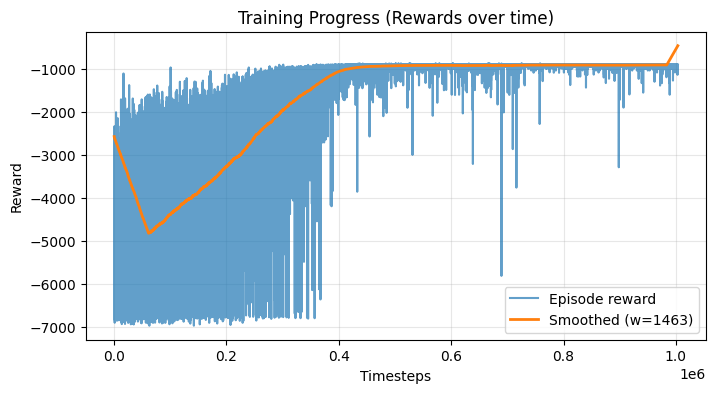

In [36]:
# Plot running-focused training progress
plot_training_progress(run_reward_cb.timesteps, run_reward_cb.ep_rewards)


In [37]:
def record_running_episode_gif(
    model: PPO,
    steps: int = 1600,
    filename: Optional[str] = None,
    deterministic: bool = True,
    history_len: int = 6,
    min_speed: float = 0.8,
    target_speed: float = 2.5,
    speed_weight: float = 5.0,
    height_weight: float = 3.0,
    stability_weight: float = 2.0, 
    gait_weight: float = 2.5,
    stationary_penalty: float = 10.0,
    energy_penalty: float = 0.01,
    progress_weight: float = 3.0,
) -> str:
    """Record a GIF using the anti-stationary walking environment."""
    if filename is None:
        filename = VIDEOS_DIR / f"anti_stationary_{int(time.time())}.gif"
    else:
        filename = pathlib.Path(filename)
    
    # Create environment with same anti-stationary parameters used during training
    env = make_running_env(
        seed=SEED,
        history_len=history_len,
        min_speed=min_speed,
        target_speed=target_speed,
        speed_weight=speed_weight,
        height_weight=height_weight,
        stability_weight=stability_weight,
        gait_weight=gait_weight,
        stationary_penalty=stationary_penalty,
        energy_penalty=energy_penalty,
        progress_weight=progress_weight,
    )()
    
    obs, info = env.reset(seed=SEED)
    frames = []
    episode_info = {
        "hull_heights": [],
        "velocities": [],
        "avg_velocities": [],
        "position_progress": [],
        "rewards": [],
        "stationary_flags": [],
        "stationary_penalties": []
    }
    
    total_stationary_steps = 0
    
    for step in range(steps):
        action, _ = model.predict(obs, deterministic=deterministic)
        obs, reward, terminated, truncated, info = env.step(action)
        
        # Collect performance metrics
        if len(obs) > 24:  # Enhanced observation
            hull_height = obs[24]
            velocity = obs[2]  # Forward velocity 
            avg_velocity = obs[31]  # Average velocity from wrapper
            position_progress = obs[32]  # Position progress
            
            episode_info["hull_heights"].append(hull_height)
            episode_info["velocities"].append(velocity)
            episode_info["avg_velocities"].append(avg_velocity)
            episode_info["position_progress"].append(position_progress)
            episode_info["rewards"].append(reward)
            
            # Track stationary behavior
            is_stationary = avg_velocity < min_speed
            episode_info["stationary_flags"].append(is_stationary)
            if is_stationary:
                total_stationary_steps += 1
            
            # Get penalty info if available
            if hasattr(info, 'get') and info.get("stationary_penalty"):
                episode_info["stationary_penalties"].append(info["stationary_penalty"])
        
        frame = env.render()
        frames.append(frame)
        
        if terminated or truncated:
            obs, info = env.reset()
    
    env.close()
    
    # Save GIF
    imageio.mimsave(filename, frames, fps=30)
    
    # Print performance summary
    if episode_info["hull_heights"]:
        avg_height = np.mean(episode_info["hull_heights"])
        avg_speed = np.mean(episode_info["avg_velocities"])
        min_speed_achieved = np.min(episode_info["avg_velocities"])
        max_speed_achieved = np.max(episode_info["avg_velocities"])
        min_height = np.min(episode_info["hull_heights"])
        total_progress = np.sum(episode_info["position_progress"])
        stationary_percentage = (total_stationary_steps / len(episode_info["stationary_flags"])) * 100
        
        print(f"Anti-Stationary Performance Summary:")
        print(f"  Average hull height: {avg_height:.2f} (min: {min_height:.2f})")
        print(f"  Average speed: {avg_speed:.2f} m/s")
        print(f"  Speed range: {min_speed_achieved:.2f} - {max_speed_achieved:.2f} m/s")
        print(f"  Total forward progress: {total_progress:.2f} units")
        print(f"  Stationary time: {stationary_percentage:.1f}% of episode")
        print(f"  Speed requirement (>={min_speed}): {'✓ PASSED' if min_speed_achieved >= min_speed * 0.8 else '✗ FAILED'}")
        print(f"  Crawling detected: {'Yes' if min_height < 1.2 else 'No'}")
    
    return str(filename)

In [38]:
# Auto-detect model obs shape and use the right recorder

def render_model_gif_auto(model: PPO, steps: int = 1000, deterministic: bool = True) -> str:
    try:
        obs_space = model.observation_space
        obs_dim = int(np.prod(obs_space.shape)) if hasattr(obs_space, "shape") else None
    except Exception:
        obs_dim = None
    # Base BipedalWalker-v3 obs_dim is 24; anything larger likely means augmented sensors
    if obs_dim is not None and obs_dim > 24:
        return record_running_episode_gif(model, steps=steps, deterministic=deterministic)
    else:
        return record_episode_gif(model, steps=steps, deterministic=deterministic)



Testing the ANTI-STATIONARY walker...
This model should NEVER stand still and must maintain speed >= 0.8 m/s
Anti-Stationary Performance Summary:
  Average hull height: 1.86 (min: 1.54)
  Average speed: 0.01 m/s
  Speed range: -0.04 - 0.06 m/s
  Total forward progress: 10.87 units
  Stationary time: 100.0% of episode
  Speed requirement (>=0.8): ✗ FAILED
  Crawling detected: No
Saved anti-stationary GIF to: artifacts_bipedal_walker\videos\anti_stationary_1755180882.gif



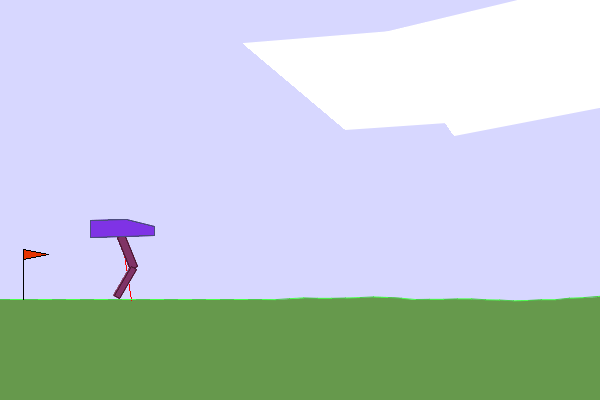


Testing movement exploration (non-deterministic)...
Anti-Stationary Performance Summary:
  Average hull height: 1.85 (min: 1.46)
  Average speed: 0.01 m/s
  Speed range: -0.04 - 0.07 m/s
  Total forward progress: 5.71 units
  Stationary time: 100.0% of episode
  Speed requirement (>=0.8): ✗ FAILED
  Crawling detected: No
Saved exploration GIF to: artifacts_bipedal_walker\videos\anti_stationary_1755180915.gif



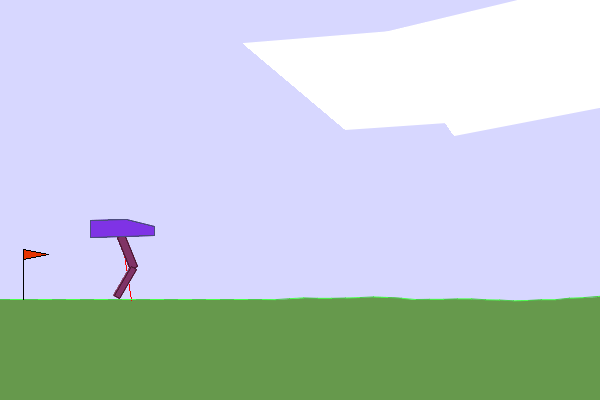

In [39]:
# Test the anti-stationary walker
print("Testing the ANTI-STATIONARY walker...")
print("This model should NEVER stand still and must maintain speed >= 0.8 m/s")

run_rollout_path = render_model_gif_auto(run_model, steps=1500, deterministic=True)
print(f"Saved anti-stationary GIF to: {run_rollout_path}")
display(display_gif(run_rollout_path))

# Test exploration behavior to see if it can find different gaits
print("\nTesting movement exploration (non-deterministic)...")
explore_rollout_path = render_model_gif_auto(run_model, steps=1000, deterministic=False)
print(f"Saved exploration GIF to: {explore_rollout_path}")
display(display_gif(explore_rollout_path, width=480))